In [68]:
import sys
import time

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
import numpy as np
import pandas as pd
from IPython.display import HTML

sys.path.append("code/.")

#import mglearn
from IPython.display import display
#from plotting_functions import *

# Preprocessing and pipeline
from sklearn.impute import SimpleImputer
from scipy.stats import reciprocal

# train test split and cross validation
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    MinMaxScaler,
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
    PolynomialFeatures,
)
from scipy.stats import reciprocal
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score, cross_validate, train_test_split, RandomizedSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.svm import SVR
from sklearn.metrics import r2_score


pd.set_option("display.max_colwidth", 200)

In [2]:
df = pd.read_csv(r'C:\Users\Asus\OneDrive\Documentos\Bancolombia\liderTI\Reto IAML\dataset_ML\restaurants_dataset.csv')  

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

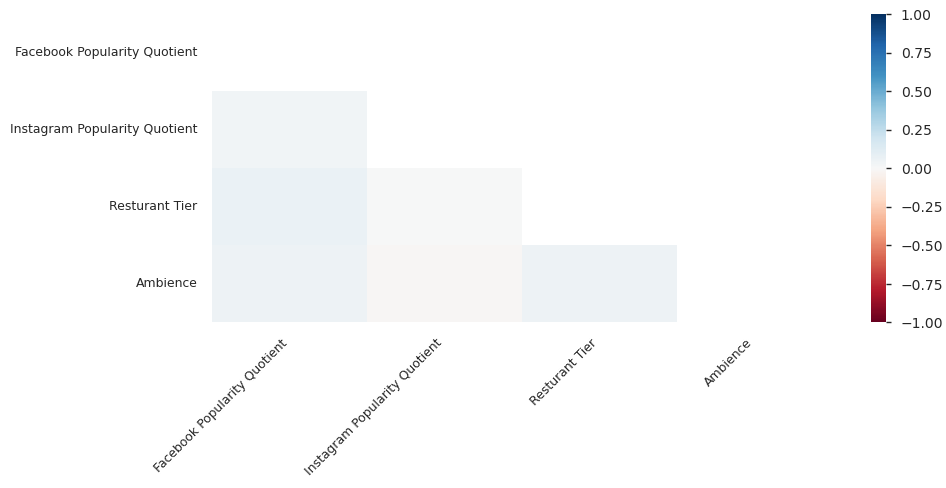

In [76]:
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file
Reporte.to_notebook_iframe()

### La variable objetivo "Facturación anual", evidencia muy buena correlación con el "Instagram Popularity Quotient"

In [4]:
dfpearson = df.copy()

In [5]:
#Identifico variables categoricas y las Numericas
num_cols = dfpearson.select_dtypes(exclude=['object']).columns
cat_cols = dfpearson.select_dtypes(include=['object']).columns

In [6]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in cat_cols:
    dfpearson[col] = le.fit_transform(dfpearson[col])

# Comprender la relación entre las variables


Tenemos siete variables categórica y todas las otras son variables numéricas. Además podemos ver que las variables "Facebook Popularity Quotient, Instagram Popularity Quotient, Resturant Tier, Overall Restaurant Rating, Live Music Rating, Comedy Gigs Rating, Value Deals Rating, Live Sports Rating, 
Ambience"  tiene algunos valores nulos. Esto afectó el cálculo de nuestra variable Annual Turnovernover

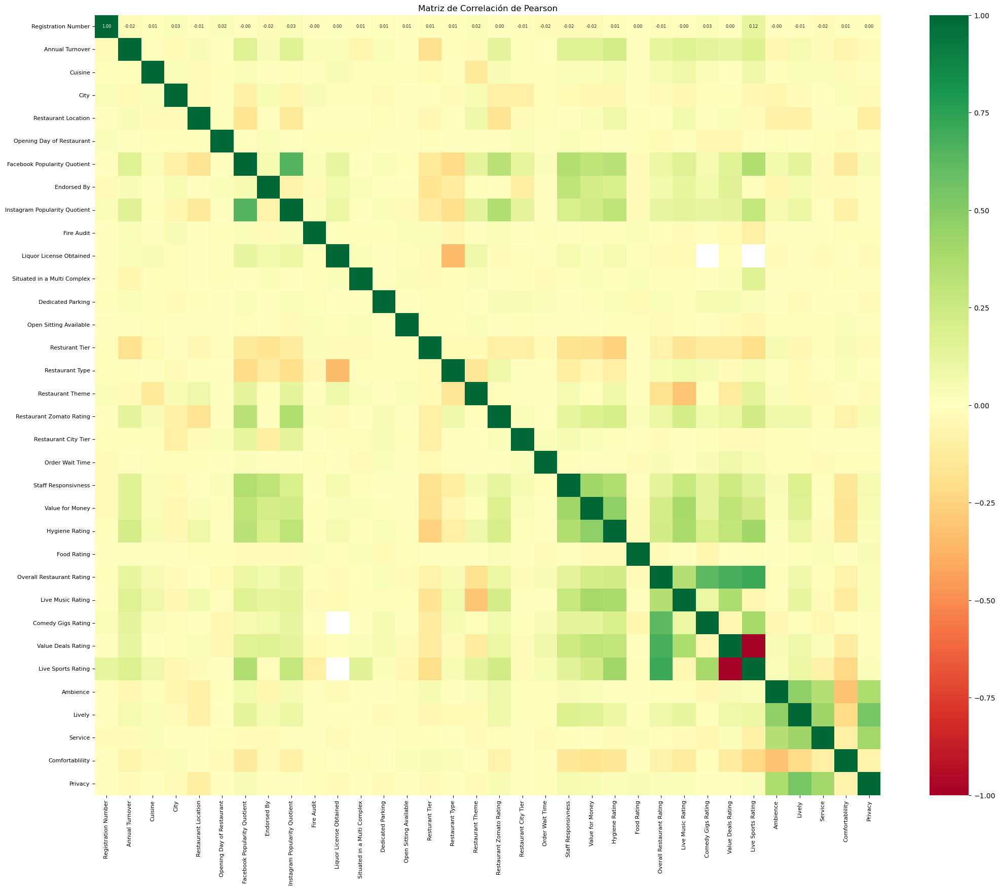

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
#La matriz de correlación de Pearson asume una relación lineal entre las variables
Pearson = dfpearson.corr(method='pearson')
fig, ax = plt.subplots(figsize=(25, 20))
# Matriz de correlación Pearson
sns.heatmap(Pearson, annot=True, cmap='RdYlGn', fmt=".2f", annot_kws={"size": 6}, ax=ax)
ax.set_title('Matriz de Correlación de Pearson', fontsize=12)
ax.tick_params(labelsize=8)
plt.show()

# Conclusiones sobre la correlación de los datos 

segun el correologramas de Pearson:

* Hay una correlación positiva notable entre 'Instagram Popularity Quotient' e 'Facebook Popularity Quotient' lo 
que sugiere que, a mayor pipularidad en facebook, mejor es el coeficiente de popularidad en instagram.
* La facturación anual indica una correlación positiva sobre "Facebook Popularity Quotient"
* Existe Independencia en algunas variables que muestran poca o ninguna correlación, lo que indica que son independientes entre sí y que el cambio en una no afecta significativamente a la otra, como es el caso de 'Open Sitting Available' e 'Hygiene Rating
* Las variables con fuertes correlaciones pueden ser buenos predictores para modelos futuros, mientras que las variables con bajas correlaciones pueden no ser tan útiles para predecir otras variables.
* La unica correlación negativa que se aprecia en los datos es Value detais rating con live sport rating.

## 4. Limpieza de datos (Data Cleaning) y preparación

In [8]:
#Relacion de columnas que posiblemente pueda eliminar
numerical_columns = dfpearson.select_dtypes(include=['float64', 'int64']).columns
Pearson_corr = dfpearson[numerical_columns].corr(method='pearson')# Calcular la matriz de correlación de Pearson
threshold = 0.2  # Se Utiliza este Umbral para considerar la correlación como insignificante
variablePosibleEliminacion = [] # Lista para almacenar las columnas a eliminar
for column in numerical_columns:# Iterar sobre las columnas numéricas
    # Excluir la correlación con la misma variable (diagonal)
    correlation_values = Pearson_corr[column].drop(column)
    # Verificar si todas las correlaciones están por debajo del umbral
    if all(abs(correlation_values) < threshold):
        variablePosibleEliminacion.append(column)
print("Columnas a eliminar:", variablePosibleEliminacion)

Columnas a eliminar: ['Registration Number', 'Fire Audit', 'Situated in a Multi Complex', 'Dedicated Parking', 'Open Sitting Available', 'Restaurant City Tier', 'Order Wait Time', 'Food Rating']


In [9]:
df = df.drop(columns=variablePosibleEliminacion)

In [10]:
df.isna().sum()

Annual Turnover                     0
Cuisine                             0
City                                0
Restaurant Location                 0
Opening Day of Restaurant           0
Facebook Popularity Quotient       99
Endorsed By                         0
Instagram Popularity Quotient      56
Liquor License Obtained             0
Resturant Tier                     49
Restaurant Type                     0
Restaurant Theme                    0
Restaurant Zomato Rating            0
Staff Responsivness                 0
Value for Money                     0
Hygiene Rating                      0
Overall Restaurant Rating         212
Live Music Rating                 765
Comedy Gigs Rating               2483
Value Deals Rating               2707
Live Sports Rating               3288
Ambience                           25
Lively                              0
Service                             0
Comfortablility                     0
Privacy                             0
dtype: int64

Se identifica que las columnas "Overall Restaurant Rating, Live Music Rating, Comedy Gigs Rating, Value Deals Rating, Live Sports Rating" continen datos faltantes mayores al 5% de la muestra, por lo cual, no se les realizara imputación de datos y tampoco se tendran en cuenta para el entrenamiento de los modelos. 

In [11]:
df = df.drop(columns=["Overall Restaurant Rating","Live Music Rating","Comedy Gigs Rating","Value Deals Rating","Live Sports Rating"])

In [12]:
def contar_duplicados(data):
  try:
    duplicados = data.duplicated()

    filas_duplicadas=data[duplicados]

    cantidad_duplicados=data.duplicated().sum()

    return cantidad_duplicados

  except Exception as e:
    return str(e)

In [13]:
contar_duplicados(df)

0

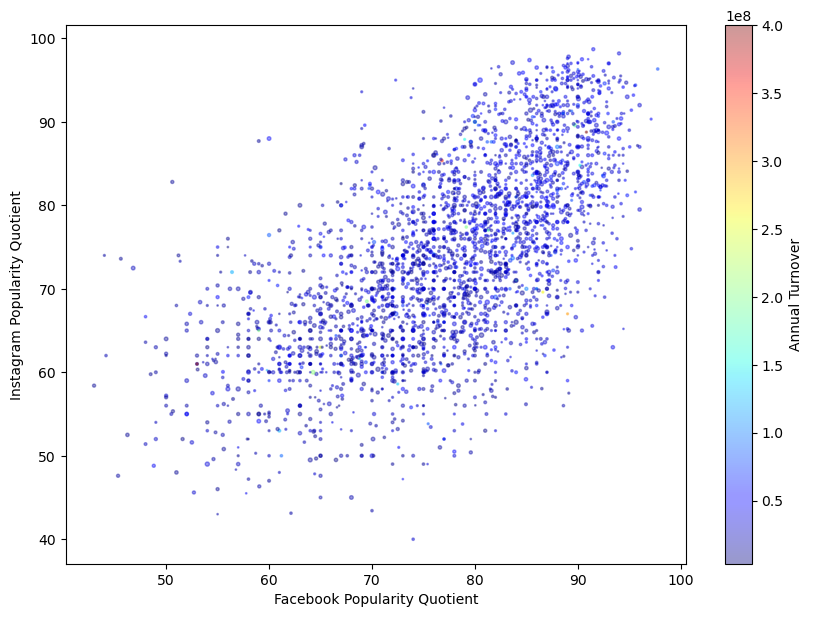

In [14]:
df.plot(
    kind="scatter",
    x="Facebook Popularity Quotient",
    y="Instagram Popularity Quotient",
    alpha=0.4,
    s=df["Comfortablility"],
    figsize=(10, 7),
    c="Annual Turnover",
    cmap=plt.get_cmap("jet"),
    colorbar=True,
    sharex=False,
);

Se crea un gráfico de dispersión que muestra la relación entre la popularidad en Facebook e Instagram, con tamaños de puntos que representan la calificación de alimentos y colores que representan la facturación anual de los restaurantes.

# ¿Qué transformaciones debemos aplicar a los datos?

Esto es lo que podemos ver del EDA:

- Algunos valores faltantes en las columnas
  * Facebook Popularity Quotient
  * Instagram Popularity Quotient
  * Resturant Tier
  * Overall Restaurant Rating
  * Live Music  Rating
  * Comedy Gigs Rating
  * Value Deals Rating
  * Live Sports Rating
  * Ambience
- Las escalas de las columnas son bastante diferentes
- Tenemos variables categóricas
  * Cuisine
  * Endorsed By
  * City
  * Restaurant Location
  * Opening Day of Restaurant
  * Restaurant Type
  * Restaurant Theme
- Existen columnas que no son muy representativas para entrenar el modelo
  * Registration Number
  * Fire Audit
  * Situated in a Multi Complex
  * Dedicated Parking
  * Open Sitting Available
  * Restaurant City Tier
  * Order Wait Time
  * Food Rating'
    
Primero vamos a trabajar con las variables **numéricas que no tienen valores nulos**. Después incluiremos de nuevo la variable categórica.

In [15]:
X_train = df.drop(columns=["Annual Turnover", "Facebook Popularity Quotient", "Instagram Popularity Quotient","Resturant Tier", "Ambience", "Cuisine", "City","Restaurant Location","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_train = df["Annual Turnover"]

X_val = df.drop(columns=["Annual Turnover", "Facebook Popularity Quotient", "Instagram Popularity Quotient","Resturant Tier", "Ambience", "Cuisine", "City","Restaurant Location","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_val  = df["Annual Turnover"]

X_test = df.drop(columns=["Annual Turnover", "Facebook Popularity Quotient", "Instagram Popularity Quotient","Resturant Tier", "Ambience", "Cuisine", "City","Restaurant Location","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_test = df["Annual Turnover"]

In [16]:
df.isna().sum()

Annual Turnover                   0
Cuisine                           0
City                              0
Restaurant Location               0
Opening Day of Restaurant         0
Facebook Popularity Quotient     99
Endorsed By                       0
Instagram Popularity Quotient    56
Liquor License Obtained           0
Resturant Tier                   49
Restaurant Type                   0
Restaurant Theme                  0
Restaurant Zomato Rating          0
Staff Responsivness               0
Value for Money                   0
Hygiene Rating                    0
Ambience                         25
Lively                            0
Service                           0
Comfortablility                   0
Privacy                           0
dtype: int64

In [17]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3493 entries, 0 to 3492
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   Liquor License Obtained   3493 non-null   int64
 1   Restaurant Zomato Rating  3493 non-null   int64
 2   Staff Responsivness       3493 non-null   int64
 3   Value for Money           3493 non-null   int64
 4   Hygiene Rating            3493 non-null   int64
 5   Lively                    3493 non-null   int64
 6   Service                   3493 non-null   int64
 7   Comfortablility           3493 non-null   int64
 8   Privacy                   3493 non-null   int64
dtypes: int64(9)
memory usage: 245.7 KB


In [18]:
# Crear un clasificador KNN con diferentes números de vecinos
n_neighbors = [1,3,5,7,9,11,13,15]
det_coef = []

for k in n_neighbors:
  clf = Pipeline(steps=[("regressor", KNeighborsRegressor(n_neighbors=k))])

  # Entrenar el clasificador con los datos de entrenamiento
  clf.fit(X_train, y_train)

  # Evaluar el rendimiento del clasificador en los datos de validación
  det_coef.append(clf.score(X_val, y_val))

C:\Users\Asus\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


[Text(0.5, 0, 'Number of neighbors'),
 Text(0, 0.5, 'Determination Coefficient (%)'),
 Text(0.5, 1.0, 'k-NN Regression')]

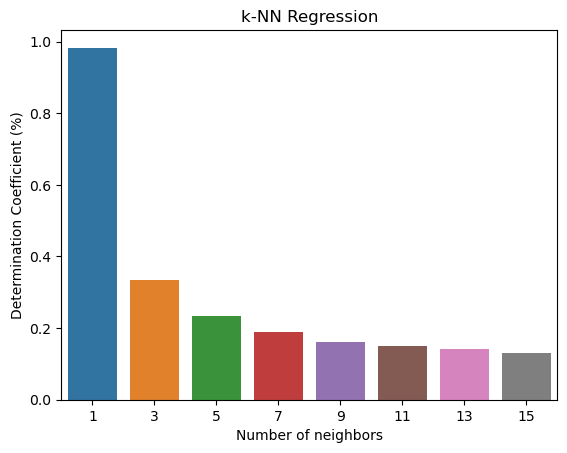

In [19]:
gfg = sns.barplot(x = n_neighbors,y = det_coef)
gfg.set(xlabel ="Number of neighbors", ylabel = "Determination Coefficient (%)", title ='k-NN Regression')

In [20]:
#Re-entrenar el modelo con los datos de entrenamiento y validación para el valor de k óptimo
k_opt = n_neighbors[np.argmax(det_coef)]
print(f"El número óptimo de vecinos es {k_opt}")
X_train_test = np.vstack([X_train,X_val])
y_train_test = np.hstack([y_train,y_val])

# Entrenar el regresor con los datos de entrenamiento
clf = Pipeline(steps=[("regressor", KNeighborsRegressor(n_neighbors=k_opt))])
clf.fit(X_train_test, y_train_test)
#Validar el rendimiento del clasificador con los datos de prueba
det_coef = clf.score(X_test, y_test)

print(f"El coeficiente de determinación en el conjunto de test es {det_coef:0.2f}")

C:\Users\Asus\anaconda3\Lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but KNeighborsRegressor was fitted without feature names
  warnings.warn(


El número óptimo de vecinos es 1
El coeficiente de determinación en el conjunto de test es 0.98


## **Imputación de datos**

La imputación de datos se utiliza para abordar valores faltantes en un conjunto de datos. Reemplaza los valores faltantes con valores estimados para permitir un análisis más completo y reducir el impacto de los valores faltantes en los resultados del análisis. La elección de la técnica de imputación depende del tipo de datos y la cantidad de valores faltantes, y en algunos casos puede ser necesario eliminar filas o columnas con valores faltantes.

# ¿Qué porcentaje de datos faltantes se puede imputar?
No hay una respuesta única a esta pregunta, ya que depende del tipo de datos y de la cantidad de valores faltantes en el conjunto de datos. En general, se recomienda tener cuidado al imputar valores faltantes y no imputar más del 5-10% de los datos totales. Si hay una gran cantidad de valores faltantes, la imputación puede no ser adecuada y es posible que deba considerar eliminar filas o columnas con valores faltantes o usar técnicas de modelado que puedan manejar valores faltantes de manera efectiva.

También es importante tener en cuenta que la imputación puede introducir sesgos en los datos y afectar los resultados del análisis. Por lo tanto, es importante evaluar cuidadosamente la calidad de los datos imputados y considerar si la imputación es necesaria y apropiada para el análisis en cuestión.ión.

In [21]:
imputer = SimpleImputer(strategy="median")
imputer.fit(X_train)
X_train_imp = imputer.transform(X_train)
X_val_imp = imputer.transform(X_val)
X_test_imp = imputer.transform(X_test)

In [22]:
pd.DataFrame(X_train_imp, columns=X_train.columns, index=X_train.index).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3493 entries, 0 to 3492
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Liquor License Obtained   3493 non-null   float64
 1   Restaurant Zomato Rating  3493 non-null   float64
 2   Staff Responsivness       3493 non-null   float64
 3   Value for Money           3493 non-null   float64
 4   Hygiene Rating            3493 non-null   float64
 5   Lively                    3493 non-null   float64
 6   Service                   3493 non-null   float64
 7   Comfortablility           3493 non-null   float64
 8   Privacy                   3493 non-null   float64
dtypes: float64(9)
memory usage: 245.7 KB


Entrenemos el regresor incluyendo estas características

# k-NN (k-nearest neighbors) 
es un algoritmo de aprendizaje supervisado que se utiliza para clasificación y regresión. Predice la etiqueta de un dato nuevo basándose en la mayoría de etiquetas en los ‘k’ datos más cercanos del conjunto de entrenamiento.

In [23]:
# Crear un clasificador KNN con diferentes números de vecinos
n_neighbors = [1,3,5,7,9,11,13,15]
det_coef = []

for k in n_neighbors:
  clf = Pipeline(steps=[("regressor", KNeighborsRegressor(n_neighbors=k))])

  # Entrenar el clasificador con los datos de entrenamiento
  clf.fit(X_train_imp, y_train)

  # Evaluar el rendimiento del clasificador en los datos de validación
  det_coef.append(clf.score(X_val_imp, y_val))

C:\Users\Asus\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


[Text(0.5, 0, 'Number of neighbors'),
 Text(0, 0.5, 'Determination Coefficient (%)'),
 Text(0.5, 1.0, 'k-NN Regression')]

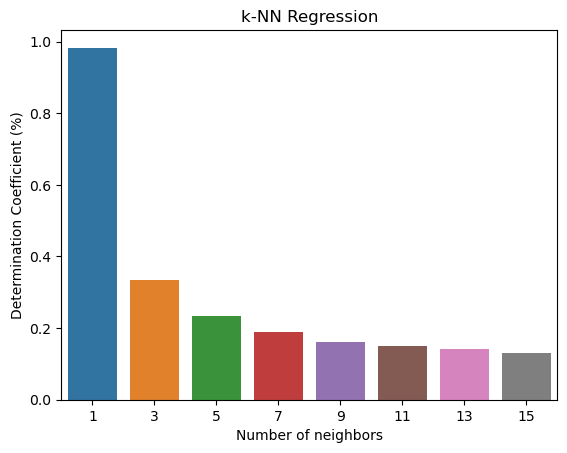

In [24]:
gfg = sns.barplot(x = n_neighbors,y = det_coef)
gfg.set(xlabel ="Number of neighbors", ylabel = "Determination Coefficient (%)", title ='k-NN Regression')

In [25]:
#Re-entrenar el modelo con los datos de entrenamiento y validación para el valor de k óptimo
k_opt = n_neighbors[np.argmax(det_coef)]
print(f"El número óptimo de vecinos es {k_opt}")
X_train_test_imp = np.vstack([X_train_imp,X_val_imp])
y_train_test = np.hstack([y_train,y_val])

# Entrenar el regresor con los datos de entrenamiento
clf = Pipeline(steps=[("regressor", KNeighborsRegressor(n_neighbors=k_opt))])
clf.fit(X_train_test_imp, y_train_test)
#Validar el rendimiento del clasificador con los datos de prueba
det_coef = clf.score(X_test_imp, y_test)

print(f"El coeficiente de determinación en el conjunto de test es {det_coef:0.2f}")

El número óptimo de vecinos es 1
El coeficiente de determinación en el conjunto de test es 0.98


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3493 entries, 0 to 3492
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Annual Turnover                3493 non-null   int64  
 1   Cuisine                        3493 non-null   object 
 2   City                           3493 non-null   object 
 3   Restaurant Location            3493 non-null   object 
 4   Opening Day of Restaurant      3493 non-null   object 
 5   Facebook Popularity Quotient   3394 non-null   float64
 6   Endorsed By                    3493 non-null   object 
 7   Instagram Popularity Quotient  3437 non-null   float64
 8   Liquor License Obtained        3493 non-null   int64  
 9   Resturant Tier                 3444 non-null   float64
 10  Restaurant Type                3493 non-null   object 
 11  Restaurant Theme               3493 non-null   object 
 12  Restaurant Zomato Rating       3493 non-null   i

In [27]:
imputer = SimpleImputer(strategy="median")
imputer.fit(X_train)
X_train_imp = imputer.transform(X_train)
X_val_imp = imputer.transform(X_val)
X_test_imp = imputer.transform(X_test)

In [28]:
pd.DataFrame(X_train_imp, columns=X_train.columns, index=X_train.index).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3493 entries, 0 to 3492
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Liquor License Obtained   3493 non-null   float64
 1   Restaurant Zomato Rating  3493 non-null   float64
 2   Staff Responsivness       3493 non-null   float64
 3   Value for Money           3493 non-null   float64
 4   Hygiene Rating            3493 non-null   float64
 5   Lively                    3493 non-null   float64
 6   Service                   3493 non-null   float64
 7   Comfortablility           3493 non-null   float64
 8   Privacy                   3493 non-null   float64
dtypes: float64(9)
memory usage: 245.7 KB


In [29]:
# Crear un clasificador KNN con diferentes números de vecinos
n_neighbors = [1,3,5,7,9,11,13,15]
det_coef = []

for k in n_neighbors:
  clf = Pipeline(steps=[("regressor", KNeighborsRegressor(n_neighbors=k))])

  # Entrenar el clasificador con los datos de entrenamiento
  clf.fit(X_train_imp, y_train)

  # Evaluar el rendimiento del clasificador en los datos de validación
  det_coef.append(clf.score(X_val_imp, y_val))

C:\Users\Asus\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


[Text(0.5, 0, 'Number of neighbors'),
 Text(0, 0.5, 'Determination Coefficient (%)'),
 Text(0.5, 1.0, 'k-NN Regression')]

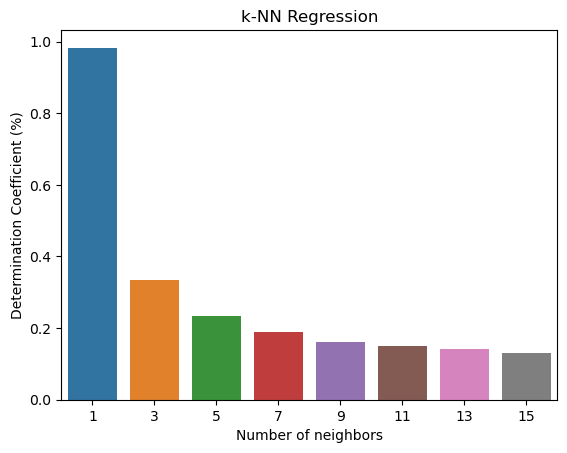

In [30]:
gfg = sns.barplot(x = n_neighbors,y = det_coef)
gfg.set(xlabel ="Number of neighbors", ylabel = "Determination Coefficient (%)", title ='k-NN Regression')

In [31]:
#Re-entrenar el modelo con los datos de entrenamiento y validación para el valor de k óptimo
k_opt = n_neighbors[np.argmax(det_coef)]
print(f"El número óptimo de vecinos es {k_opt}")
X_train_test_imp = np.vstack([X_train_imp,X_val_imp])
y_train_test = np.hstack([y_train,y_val])

# Entrenar el regresor con los datos de entrenamiento
clf = Pipeline(steps=[("regressor", KNeighborsRegressor(n_neighbors=k_opt))])
clf.fit(X_train_test_imp, y_train_test)
#Validar el rendimiento del clasificador con los datos de prueba
det_coef = clf.score(X_test_imp, y_test)

print(f"El coeficiente de determinación en el conjunto de test es {det_coef:0.2f}")

El número óptimo de vecinos es 1
El coeficiente de determinación en el conjunto de test es 0.98


# Normalización de las variables

Para esto no se tienen en cuenta las variables categoricas

In [32]:
X_train = df.drop(columns=["Restaurant Location","Cuisine","City","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_train = df["Annual Turnover"]

X_val = df.drop(columns=["Restaurant Location","Cuisine","City","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_val = df["Annual Turnover"]

X_test = df.drop(columns=["Restaurant Location","Cuisine","City","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_test = df["Annual Turnover"]

In [33]:
imputer = SimpleImputer(strategy="median")
imputer.fit(X_train)
X_train_imp = imputer.transform(X_train)
X_val_imp = imputer.transform(X_val)
X_test_imp = imputer.transform(X_test)

In [60]:
from sklearn import preprocessing
import pandas as pd

# Suponiendo que 'X_train_imp' es un DataFrame o un array con los datos que quieres normalizar
# y 'X_train' es el DataFrame original con las columnas e índices apropiados

# Crear una instancia de MinMaxScaler
min_max_scaler = preprocessing.MinMaxScaler()

# Ajustar el escalador a los datos
min_max_scaler.fit(X_train_imp)

# Transformar los datos
X_train_normalized = min_max_scaler.transform(X_train_imp)

# Crear un nuevo DataFrame con los datos normalizados
X_train_normalized_df = pd.DataFrame(X_train_normalized, columns=X_train.columns, index=X_train.index)

In [42]:
X_train_normalized_df

,Annual Turnover,Facebook Popularity Quotient,Instagram Popularity Quotient,Liquor License Obtained,Resturant Tier,Restaurant Zomato Rating,Staff Responsivness,Value for Money,Hygiene Rating,Ambience,Lively,Service,Comfortablility,Privacy
0,0.097100,0.754200,0.950596,1.0,1.0,0.6,0.571429,0.666667,0.500,0.8,0.8,0.6,0.6,0.6
1,0.117276,0.774288,0.766610,1.0,1.0,0.6,0.714286,0.833333,0.750,0.5,0.7,0.7,0.3,0.8
2,0.073140,0.766983,0.480409,1.0,1.0,0.6,0.714286,0.666667,0.250,0.7,1.0,0.5,0.2,0.8
3,0.268600,0.777940,0.742760,1.0,0.0,0.6,0.714286,0.666667,0.625,0.7,0.7,0.4,0.3,0.5
4,0.041614,0.657414,0.626917,1.0,1.0,0.6,0.571429,0.833333,0.375,0.7,0.6,0.2,0.4,0.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3488,0.093317,0.476625,0.376661,1.0,1.0,0.8,0.571429,0.666667,0.625,0.7,0.7,0.6,0.6,0.8
3489,0.073140,0.876552,0.959114,1.0,1.0,0.6,0.428571,0.666667,0.750,0.4,0.9,0.4,0.0,0.5
3490,0.098361,0.690833,0.797274,1.0,1.0,0.6,0.571429,0.500000,0.625,0.6,0.8,0.3,0.3,0.7
3491,0.124842,0.664719,0.783646,1.0,1.0,0.6,0.571429,0.333333,0.500,0.7,0.6,0.3,0.3,0.6


# Modelo de Regresión Lineal


In [43]:
# Definamos el "random_state" para que los resultados sean reproducibles:
random_state = 42
np.random.seed(random_state)

In [44]:
# Cambiemos la fuente de las gráficas de matplotlib:
plt.rc('font', family='serif', size=12)

In [46]:
X_train = df.drop(columns=["Restaurant Location","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_train = df["Annual Turnover"]

X_val = df.drop(columns=["Restaurant Location","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_val = df["Annual Turnover"]

X_test = df.drop(columns=["Restaurant Location","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_test = df["Annual Turnover"]

In [47]:
#Encontrar variables numéricas y categóricas
cat_cols = X_train.select_dtypes(include=object).columns
num_cols = X_train.select_dtypes(include=np.number).columns

In [48]:
#Definir el pipeline de pre-procesamiento
numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy="median")),("scaler", StandardScaler())]
)

categorical_transformer = Pipeline(
    steps=[("encoder", OneHotEncoder(handle_unknown="ignore"))]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, num_cols),
        ("cat", categorical_transformer, cat_cols),
    ]
)

In [49]:
#Definamos el regresor ridge
ridge_base = Ridge()
clf_ridge = Pipeline(steps=[("preprocessor", preprocessor)
                            
                            
                            , ('poly', PolynomialFeatures(include_bias=True)), ("regressor", ridge_base)])
# Definamos las distribuciones de parámetros sobre las que haremos la búsqueda:
param_distributions = {
    'poly__degree': list(range(1, 4)),
    'regressor__alpha': reciprocal(1e-5, 1e3)
}
# Definamos nuestros modelos mediante RandomizedSearchCV:
search_ridge = RandomizedSearchCV(
    clf_ridge, 
    param_distributions=param_distributions, 
    n_iter=10,
    cv=5,
    n_jobs=-1
)
#Entrenemos los modelos
search_ridge.fit(X_train, y_train)
print(search_ridge)
print(search_ridge.best_params_)
# Obtengamos el R^2 y el MAE de prueba para el modelo ridge:
print('Modelo ridge')
print(f'R^2: {search_ridge.score(X_test, y_test)}')
print(f'MAE: {mean_absolute_error(y_test, search_ridge.predict(X_test))}')

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               Index(['Annual Turnover', 'Facebook Popularity Quotient',
       'Instagram Popularity Quotient', 'Liquor License Obtained',
       'Resturant Tier', 'Restaurant Zomato Rating', 'Staff...
       'Comfortablility', 'Privacy'],
      dtype='object')),
                                     

In [50]:
#Definamos el regresor lasso
lasso_base = Lasso()
clf_lasso = Pipeline(steps=[("preprocessor", preprocessor), ('poly', PolynomialFeatures(include_bias=True)), ("regressor", lasso_base)])
# Definamos las distribuciones de parámetros sobre las que haremos la búsqueda:
param_distributions = {
    'poly__degree': list(range(1, 4)),
    'regressor__alpha': np.logspace(-4, 4, 20),  # Regularization strength; smaller values = weaker regularization
}
# Definamos nuestros modelos mediante RandomizedSearchCV:
search_lasso = RandomizedSearchCV(
    clf_lasso, 
    param_distributions=param_distributions, 
    n_iter=10,
    cv=5,
    verbose=1,
    n_jobs=4
)
#Entrenemos los modelos
search_lasso.fit(X_train, y_train)
print(search_lasso)
print(search_lasso.best_params_)
# Obtengamos el R^2 y el MAE de prueba para el modelo ridge:
print('Modelo Lasso')
print(f'R^2: {search_lasso.score(X_test, y_test)}')
print(f'MAE: {mean_absolute_error(y_test, search_lasso.predict(X_test))}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               Index(['Annual Turnover', 'Facebook Popularity Quotient',
       'Instagram Popularity Quotient', 'Liquor License Obtained',
       'Resturant Tier', 'Restaurant Zomato Rating', 'Staff...
                   param_distributions

In [51]:
#Definamos el regresor Elastic-net
elnet_base = ElasticNet()
clf_elnet = Pipeline(steps=[("preprocessor", preprocessor), ('poly', PolynomialFeatures(include_bias=True)), ("regressor", elnet_base)])
# Definamos las distribuciones de parámetros sobre las que haremos la búsqueda:
param_distributions = {
    'poly__degree': list(range(1, 4)),
    'regressor__alpha': np.logspace(-4, 4, 20),  # Regularization strength; smaller values = weaker regularization
    'regressor__l1_ratio': np.linspace(0, 1, 10),  # Ratio for Elastic Net
}
# Definamos nuestros modelos mediante RandomizedSearchCV:
search_elnet = RandomizedSearchCV(
    clf_elnet, 
    param_distributions=param_distributions, 
    n_iter=10,
    cv=5,
    n_jobs=-1
)
#Entrenemos los modelos
search_elnet.fit(X_train, y_train)
print(search_elnet)
print(search_elnet.best_params_)
# Obtengamos el R^2 y el MAE de prueba para el modelo ridge:
print('Modelo Elastic net')
print(f'R^2: {search_elnet.score(X_test, y_test)}')
print(f'MAE: {mean_absolute_error(y_test, search_elnet.predict(X_test))}')

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               Index(['Annual Turnover', 'Facebook Popularity Quotient',
       'Instagram Popularity Quotient', 'Liquor License Obtained',
       'Resturant Tier', 'Restaurant Zomato Rating', 'Staff...
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.158

In [52]:
#Definamos el regresor basado en redes neuronales
mlp_base = MLPRegressor()
clf_mlp = Pipeline(steps=[("preprocessor", preprocessor), ("regressor", mlp_base)])
param_distributions = {
    "regressor__hidden_layer_sizes": [(50, 50), (100, 100), (50, 100, 50)],
    "regressor__activation": ["relu", "tanh", "logistic"],
    #"solver": ["adam", "sgd"],
    "regressor__alpha": np.logspace(-5, 3, 9),
    "regressor__learning_rate": ["constant", "invscaling", "adaptive"],
    "regressor__max_iter": [200, 500, 1000]
}
# Definamos nuestros modelos mediante RandomizedSearchCV:
search_mlp = RandomizedSearchCV(
    clf_mlp, 
    param_distributions=param_distributions, 
    n_iter=10,
    cv=5,
    n_jobs=-1
)
#Entrenemos el modelo
search_mlp.fit(X_train, y_train)
# Obtengamos los mejores hiperparámetros encontrados para el modelo ridge
search_mlp.best_params_
# Obtengamos el R^2 y el MAE de prueba para el modelo ridge:
print('Modelo ridge')
print(f'R^2: {search_mlp.score(X_test, y_test)}')
print(f'MAE: {mean_absolute_error(y_test, search_mlp.predict(X_test))}')

Modelo ridge
R^2: 0.9560701490614174
MAE: 2978801.362671987


C:\Users\Asus\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


# conclusiones sobre los resultados del modelo de regresión lineal

* Alta Precisión: Los valores de R^2 cercanos a 1.0 para los modelos Ridge y Lasso indican que ambos modelos tienen una alta precisión en la predicción de los datos, con el modelo Lasso alcanzando una precisión perfecta.
* Error Mínimo: El MAE (Error Absoluto Medio) muy bajo en el modelo Lasso sugiere que las predicciones del modelo están muy cerca de los valores reales, con un error prácticamente insignificante.
* Consistencia en Ridge: Aunque hay una diferencia significativa en el R^2 entre los dos modelos Ridge, ambos muestran un alto nivel de ajuste al conjunto de datos, especialmente el primero con un R^2 prácticamente perfecto.
* Posible Sobreajuste: Un R^2 de 1.0 en el modelo Lasso podría indicar un sobreajuste, lo que significa que el modelo podría no generalizar bien con datos nuevos o no vistos.
* Consideraciones de Error: El MAE relativamente alto en el segundo modelo Ridge sugiere que puede haber una variabilidad significativa en las predicciones o posibles valores atípicos que afectan al rendimiento del modelo.


In [ ]:
# 3. modelo Clasificación de Maquinas De Vectores 

In [62]:
X_train = df.drop(columns=["Restaurant Location","Cuisine","City","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_train = df["Annual Turnover"]

X_val = df.drop(columns=["Restaurant Location","Cuisine","City","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_val = df["Annual Turnover"]

X_test = df.drop(columns=["Restaurant Location","Cuisine","City","Opening Day of Restaurant","Restaurant Type", "Endorsed By", "Restaurant Theme"])
y_test = df["Annual Turnover"]

In [63]:
imputer = SimpleImputer(strategy="median")
imputer.fit(X_train)
X_train_imp = imputer.transform(X_train)
X_val_imp = imputer.transform(X_val)
X_test_imp = imputer.transform(X_test)

In [72]:
from sklearn import preprocessing
import pandas as pd

# Suponiendo que 'X_train_imp' es un DataFrame o un array con los datos que quieres normalizar
# y 'X_train' es el DataFrame original con las columnas e índices apropiados

# Crear una instancia de MinMaxScaler
min_max_scaler = preprocessing.MinMaxScaler()

# Ajustar el escalador a los datos
min_max_scaler.fit(X_train_imp)

# Transformar los datos
X_train_normalized = min_max_scaler.transform(X_train_imp)
X_test_normalized = min_max_scaler.transform(X_test_imp)

# Crear un nuevo DataFrame con los datos normalizados
X_train_normalized_df = pd.DataFrame(X_train_normalized, columns=X_train.columns, index=X_train.index)

In [66]:
SVMR_linear    = SVR(kernel='linear' , C = 1000)
SVMR_Pol2   = SVR(kernel='poly'   , C = 1000, degree = 2)
SVMR_Pol3   = SVR(kernel='poly'   , C = 1000, degree = 3)
SVMR_rbf   = SVR(kernel='rbf'    , C = 1000)
SVMR_sig   = SVR(kernel='sigmoid', C = 1000)
 
    
SVMR_linear.fit(X_train_normalized_df, y_train)  
SVMR_Pol2.fit(X_train_normalized_df, y_train)  
SVMR_Pol3.fit(X_train_normalized_df, y_train)  
SVMR_rbf.fit(X_train_normalized_df, y_train)   
SVMR_sig.fit(X_train_normalized_df, y_train)  

SVR(C=1000, kernel='sigmoid')

# Evaluación del modelo

In [74]:
print('Linear   Training: ', SVMR_linear.score(X_train_normalized_df,y_train), 'Test:',r2_score(y_test,SVMR_linear.predict(X_test_normalized)))
print('Poly 2   Training: ', SVMR_Pol2.score(X_train_normalized_df,y_train), 'Test:',r2_score(y_test,SVMR_Pol2.predict(X_test_normalized)))
print('Poly 3   Training: ', SVMR_Pol3.score(X_train_normalized_df,y_train), 'Test:',r2_score(y_test,SVMR_Pol3.predict(X_test_normalized)))
print('rbf      Training: ', SVMR_rbf.score(X_train_normalized_df,y_train), 'Test:',r2_score(y_test,SVMR_rbf.predict(X_test_normalized)))
print('sigmoide Training: ', SVMR_sig.score(X_train_normalized_df,y_train), 'Test:',r2_score(y_test,SVMR_sig.predict(X_test_normalized)))


C:\Users\Asus\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


Linear   Training:  0.00213080304777169 Test: 0.00213080304777169


C:\Users\Asus\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


Poly 2   Training:  0.022958800121749112 Test: 0.022958800121749112


C:\Users\Asus\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


Poly 3   Training:  0.07925677706541656 Test: 0.07925677706541656


C:\Users\Asus\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


rbf      Training:  0.0009997691718994783 Test: 0.0009997691718994783


C:\Users\Asus\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


sigmoide Training:  -0.0011202494836879406 Test: -0.0011202494836879406


## Conclusiones del modelo

Los resultados de la evaluación de un modelo de máquina de soporte vectorial (SVC) indican cómo se desempeña el modelo en los datos de entrenamiento y prueba. Aquí hay algunas observaciones basadas en los valores proporcionados:

* Linear: El error (pérdida) en los datos de entrenamiento y prueba es muy bajo (0.0021).
Esto sugiere que el modelo lineal se ajusta bien a los datos y generaliza correctamente.
  
* Poly 2: El error en los datos de entrenamiento y prueba es mayor que en el modelo lineal (0.0229).
La complejidad del modelo polinómico de grado 2 podría estar causando un poco de sobreajuste.
* Poly 3:El error en los datos de entrenamiento y prueba es aún mayor (0.0793).
El modelo polinómico de grado 3 podría estar sobreajustando significativamente los datos.
* rbf (Radial Basis Function): El error es muy bajo en ambos conjuntos de datos (0.0010).
El kernel rbf es una buena elección para separaciones 
no lineales.ción del modelo.

# Conclusión general y selección del modelo.
Para determinar predicciones sobre la facturación anual de un restaurante, la Regresión Lineal sería el modelo más óptimo entre las opciones dadas.

* K-NN (K-Nearest Neighbors) es un algoritmo de clasificación y regresión que predice el valor de una variable basándose en la similitud con los ‘K’ vecinos más cercanos. Es útil cuando la relación entre las variables es no lineal, pero puede no ser tan eficiente con conjuntos de datos grandes y requiere una selección cuidadosa del valor ‘K’.tos.
  
* Regresión Lineal es un modelo predictivo que asume una relación lineal entre las variables independientes y la variable dependiente (en este caso, la facturación anual). Es ideal para hacer predicciones continuas y se adapta bien a problemas donde se espera que los cambios en las variables independientes tengan efectos proporcionales en la variable depen

* El modelo de Maquinas de vectores se comporta bastante bien respecto a la predicción de la variable objetivo.diente.

Por lo tanto, para predecir un valor numérico continuo como la facturación anual de un restaurante, la regresión lineal sería la elección más adecuada, siempre y cuando los datos sigan una tendencia lineal y no haya demasiadas variables no lineales o complejas involucradas.adas.